In [1]:
import sys
sys.path.append('/home/nick/projects')
# from PointGPT import segmentation
from fle_3d.fle_3d import FLEBasis3D
import umap.umap_ as umap
import numpy as np
import pandas as pd
import os
from glob2 import glob
import plotly.express as px
import plotly.graph_objects as go
import torch
from src.utilities.functions import path_leaf
from src.utilities.fin_class_def import FinData
from tqdm import tqdm
from sklearn.neighbors import KernelDensity

### Load test dataset

In [2]:
root = "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/"

fin_object_path = os.path.join(root, "point_cloud_data", "fin_objects", "")
fin_object_list = sorted(glob(fin_object_path + "*.pkl"))

In [3]:
file_ind = 46
seg_type = "tissue_only_best_model_tissue"
fp = fin_object_list[file_ind]
point_prefix = path_leaf(fp).replace("_fin_object.pkl", "")
print(point_prefix)

fin_data = FinData(data_root=root, name=point_prefix, tissue_seg_model=seg_type)

fin_df = fin_data.full_point_data
fin_df = fin_df.loc[fin_df["fin_label_curr"]==1, :]

20240711_01_well0046_time0000


In [4]:
# fit density
X = fin_df[["X", "Y", "Z"]].to_numpy()
X = X - np.mean(X, axis=0)
kde = KernelDensity(bandwidth=4, kernel="gaussian").fit(X)

# draw samples
fin_rs = kde.sample(n_samples=1024)

In [5]:
res = 25
x_axis = np.linspace(-100, 100, res)
y_axis = np.linspace(-100, 100, res)
z_axis = np.linspace(-50, 50, res)

x_grid, y_grid, z_grid = np.meshgrid(x_axis, y_axis, z_axis)

test_array = np.c_[x_grid.ravel(), y_grid.ravel(), z_grid.ravel()]

score_array = kde.score_samples(test_array)
score_array_thresh = score_array.copy()
# score_array_thresh[score_array_thresh < -20] = -np.inf
prob_array = np.exp(score_array_thresh)

In [113]:
fig = go.Figure(data=go.Volume(
    x=x_grid.flatten(), y=y_grid.flatten(), z=z_grid.flatten(),
    value=prob_array.flatten(),
    opacity=0.1,
    surface_count=25,
    ))
fig.update_layout(scene_xaxis_showticklabels=False,
                  scene_yaxis_showticklabels=False,
                  scene_zaxis_showticklabels=False)
fig.show()

In [114]:
prob_grid = np.reshape(prob_array, x_grid.shape)
prob_grid = prob_grid / np.max(np.abs(prob_grid))
# prob_grid = 2*(prob_grid - 1)

N = prob_grid.shape[0]        #replace this by the side-length of your volume array
bandlimit = 15   #maximum number of basis functions to use
eps = 1e-7      #desired accuracy
fle = FLEBasis3D(N, bandlimit, eps, force_real=True)
# fle.force_real=True
coeff = fle.evaluate_t(prob_grid)
volume = fle.evaluate(coeff)
weights = fle.weights

In [115]:
fig = go.Figure(data=go.Volume(
    x=x_grid.flatten(), y=y_grid.flatten(), z=z_grid.flatten(),
    value=volume.flatten(),
    isomin=0.01,
    isomax=1,
    opacity=0.1,
    surface_count=25,
    # colorscale="magma"
    ))
fig.update_layout(scene_xaxis_showticklabels=False,
                  scene_yaxis_showticklabels=False,
                  scene_zaxis_showticklabels=False)
fig.show()

In [79]:
kde_bandwidth = 4
res = 25
recon_bw = 20
eps = 1e-6      #desired accuracy
x_axis = np.linspace(-100, 100, res)
y_axis = np.linspace(-100, 100, res)
z_axis = np.linspace(-40, 40, res)

x_grid, y_grid, z_grid = np.meshgrid(x_axis, y_axis, z_axis)

test_array = np.c_[x_grid.ravel(), y_grid.ravel(), z_grid.ravel()]

df_list = []
density_array_list = []
recon_array_list = []
sph_coeff_list = []
sph_weight_list = []
prefix_list = []

for file_ind in tqdm(range(len(fin_object_list))):

    fp = fin_object_list[file_ind]
    point_prefix = path_leaf(fp).replace("_fin_object.pkl", "")
    # print(point_prefix)
    
    fin_data = FinData(data_root=root, name=point_prefix, tissue_seg_model=seg_type)

    # get fin dataset
    fin_df = fin_data.full_point_data
    fin_df = fin_df.loc[fin_df["fin_label_curr"]==1, :]
    fin_axis_df = fin_data.axis_fin
    fin_axes = fin_data.calculate_axis_array(fin_axis_df)
            
    if fin_df.shape[0] > 0:
        # fit density function # fit density
        X_raw = fin_df[["X", "Y", "Z"]].to_numpy()
        X = np.matmul(X_raw - np.mean(X_raw, axis=0), fin_axes.T)
        # X = X - np.mean(X, axis=0)
        kde = KernelDensity(bandwidth=kde_bandwidth, kernel="gaussian").fit(X)
    
        # get density grid
        score_array = kde.score_samples(test_array)
        score_array_thresh = score_array.copy()
        prob_array[prob_array < -15] = -np.inf
        prob_array = np.exp(score_array_thresh)
        prob_grid = np.reshape(prob_array, x_grid.shape)
        prob_grid = prob_grid / np.max(np.abs(prob_grid))
    
        # fit transform
        N = prob_grid.shape[0]  #replace this by the side-length of your volume array
        # bandlimit = 25   #maximum number of basis functions to use
    
        fle0 = FLEBasis3D(N, recon_bw, eps, force_real=True)
        coeff = fle0.evaluate_t(prob_grid)
        volume = fle0.evaluate(coeff)
        weight = fle0.weights

    else:
        prob_grid = np.zeros_like(test_array)
        volume = prob_grid.copy()
        coeff = np.empty_like(sph_coeff_list[-1])
        coeff[:] = np.nan

        weight = np.empty_like(sph_weight_list[-1])
        weight[:] = np.nan
        
    
    
    # store results
    df_list.append(fin_df)
    density_array_list.append(prob_grid)
    recon_array_list.append(volume)
    sph_coeff_list.append(coeff)
    sph_weight_list.append(weight)
    prefix_list.append(point_prefix)

    

100%|██████████| 97/97 [00:46<00:00,  2.10it/s]


In [80]:
# calculate loading arrays for each fin
l_vec = np.asarray(fle0.ls)
l_index = np.unique(l_vec)
k_vec = np.asarray(fle0.ks)
k_index = np.unique(k_vec)
power_array_list = []
power_vec_list = []
for i in tqdm(range(len(sph_coeff_list))):
    power_array = np.empty((len(l_index), len(k_index)))
    coeffs = sph_coeff_list[i]
    mags = np.absolute(coeffs)**2
    for li, l in enumerate(l_index):
        for ki, k in enumerate(k_index):
            indices = (l_vec==l) & (k_vec==k)
            power_array[li, ki] = np.sum(mags[indices])

    power_array_list.append(power_array)
    power_vec_list.append(power_array.ravel())

100%|██████████| 97/97 [00:00<00:00, 747.20it/s]


(82, 234)


/tmp/ipykernel_161454/1871537841.py:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_161454/1871537841.py:66: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_161454/1871537841.py:67: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipyke

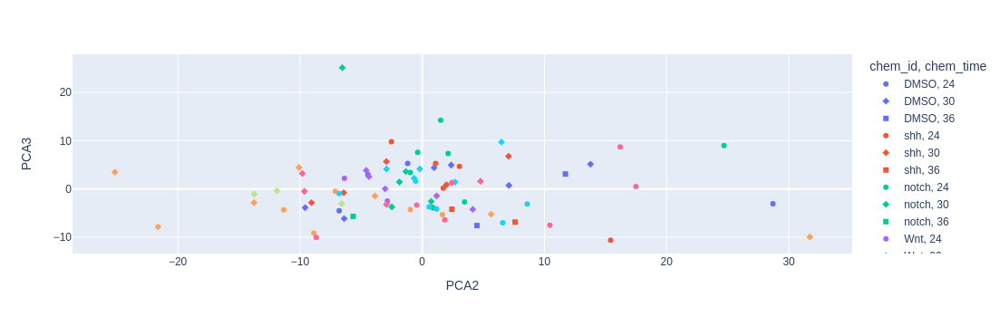

In [103]:
import plotly
from sklearn.decomposition import PCA

dark2 = plotly.colors.qualitative.Dark2
set2 = plotly.colors.qualitative.Set2
pastel2 = plotly.colors.qualitative.Pastel2

metadata_root = "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/metadata/"
fin_stats_df = pd.read_csv(metadata_root + "fin_stats_df.csv")

color_dict = dict({
    "DMSO_24": "lightgray", 
    "DMSO_30": "gray", 
    "DMSO_36": "darkgray", 
    "Bmp_24": "rgb(253, 205, 172)",
    "Bmp_30": "rgb(252, 141, 98)", 
    "Bmp_36": "rgb(217, 95, 2)",  
    "Wnt_24": "rgb(179, 266, 205)",
    "Wnt_30": "rgb(102, 194, 165)", 
    "Wnt_36": "rgb(27, 158, 119)", 
    "fgf_24": pastel2[-2], 
    "fgf_30": set2[-2], 
    "fgf_36": dark2[-2],
    "notch_24": pastel2[-3],
    "notch_30": set2[-3], 
    "notch_36": dark2[-3], 
    "ra_24": pastel2[-4],
    "ra_30": set2[-4], 
    "ra_36": dark2[-4],
    "shh_24": pastel2[-5],
    "shh_30": set2[-5], 
    "shh_36": dark2[-5],
    "tgfb_24": pastel2[-6],
    "tgfb_30": set2[-6], 
    "tgfb_36": dark2[-6],
}
)

well_num_vec = np.asarray([int(prefix[-13:-9]) for prefix in prefix_list])
exp_vec = [prefix[:11] for prefix in prefix_list]
ft_df = pd.DataFrame(well_num_vec, columns=["well_index"])
ft_df["experiment_date"] = exp_vec
test = ft_df.merge(fin_stats_df, how="left", on=["well_index", "experiment_date"], indicator=True)
ft1 = test._merge=="both"

n_components = 10
sph_PCA = PCA(n_components = n_components)

coeff_array = np.asarray(power_vec_list)
coeff_array = coeff_array[ft1, :]
nan_ft = ~np.isnan(coeff_array[:, 0])
coeff_array_nn = coeff_array[nan_ft, :]

fin_stats_nn = fin_stats_df.loc[nan_ft,:]

# color_list = [color_dict[c] for c in fin_class_nn]



sph_PCA.fit(coeff_array_nn)
coeffs_pca = sph_PCA.transform(coeff_array_nn)
coeffs_reduced = sph_PCA.inverse_transform(coeffs_pca)
print(coeffs_reduced.shape)

fin_stats_nn.loc[:, "PCA0"] = coeffs_pca[:, 0]
fin_stats_nn.loc[:, "PCA1"] = coeffs_pca[:, 1]
fin_stats_nn.loc[:, "PCA2"] = coeffs_pca[:, 2]
fin_stats_nn.loc[:, "PCA3"] = coeffs_pca[:, 3]
fin_stats_nn.loc[:, "PCA4"] = coeffs_pca[:, 4]

fig = px.scatter(fin_stats_nn, x="PCA2", y="PCA3", color="chem_id", symbol="chem_time")
fig.show()

In [104]:
import umap.umap_ as umap
reducer = umap.UMAP(n_components=3)

embedding = reducer.fit_transform(coeffs_pca)

fin_stats_nn.loc[:, "UMAP0"] = embedding[:, 0]
fin_stats_nn.loc[:, "UMAP1"] = embedding[:, 1]
fin_stats_nn.loc[:, "UMAP2"] = embedding[:, 2]

/tmp/ipykernel_161454/1125386580.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_161454/1125386580.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_161454/1125386580.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [101]:
power_array.shape

(26, 9)

In [117]:
fig = px.scatter_3d(fin_stats_nn.loc[fin_stats_nn["estimated_stage_hpf"]>55, :], x="UMAP0", y="UMAP1", z="UMAP2", color="chem_id", symbol="chem_time")
fig.update_traces(marker=dict(size=4))
fig.show()

In [99]:
ind = 46

vol_true = density_array_list[ind]
vol_recon0 = recon_array_list[ind]


fig = go.Figure(data=go.Volume(
    x=x_grid.flatten(), y=y_grid.flatten(), z=z_grid.flatten(),
    value=np.real(vol_true).flatten(),
    isomin=0.05,
    isomax=1,
    opacity=0.1,
    surface_count=25,
    colorscale="magma"
    ))
fig.update_layout(scene_xaxis_showticklabels=False,
                  scene_yaxis_showticklabels=False,
                  scene_zaxis_showticklabels=False)
fig.show()

In [100]:
fig = go.Figure(data=go.Volume(
    x=x_grid.flatten(), y=y_grid.flatten(), z=z_grid.flatten(),
    value=np.real(vol_recon0).flatten(),
    isomin=0.05,
    isomax=1,
    opacity=0.1,
    surface_count=25,
    colorscale="magma"
    ))
fig.update_layout(scene_xaxis_showticklabels=False,
                  scene_yaxis_showticklabels=False,
                  scene_zaxis_showticklabels=False)
fig.show()

In [113]:
recon_bw = 25

file_ind = 1
fp = fin_object_list[file_ind]
point_prefix = path_leaf(fp).replace("_fin_object.pkl", "")
print(point_prefix)

fin_data = FinData(data_root=root, name=point_prefix, tissue_seg_model=seg_type)

# get fin dataset
fin_df = fin_data.full_point_data
fin_df = fin_df.loc[fin_df["fin_label_curr"]==1, :]

# fit density function # fit density
X = fin_df[["X", "Y", "Z"]].to_numpy()
X = X - np.mean(X, axis=0)
kde = KernelDensity(bandwidth=kde_bandwidth, kernel="gaussian").fit(X)

# get density grid
score_array = kde.score_samples(test_array)
score_array_thresh = score_array.copy()
prob_array[prob_array < -5] = -np.inf
prob_array = np.exp(score_array_thresh)
prob_grid = np.reshape(prob_array, x_grid.shape)
prob_grid = prob_grid / np.max(np.abs(prob_grid))

# fit transform
N = prob_grid.shape[0]  #replace this by the side-length of your volume array
# bandlimit = 25   #maximum number of basis functions to use

fle0 = FLEBasis3D(N, recon_bw, eps, force_real=True)
coeff = fle0.evaluate_t(prob_grid)
volume = fle0.evaluate(coeff)
weigths = fle0.weights


print(weight)

20240711_01_well0001_time0000
[nan+0.j nan+0.j nan+0.j ... nan+0.j nan+0.j nan+0.j]


In [112]:
bandlimit = 25   #maximum number of basis functions to use
eps = 1e-7      #desired accuracy
fle = FLEBasis3D(N, bandlimit, eps, force_real=True)
      FLEBasis3D(N, recon_bw, eps, force_real=True)
# fle.force_real=True
coeff = fle.evaluate_t(prob_grid)
volume = fle.evaluate(coeff)
weights = fle.weights

print(weights)

[4.05695971e-05 3.90905134e-04 8.03916091e-04 1.19886244e-03
 1.60087375e-03 1.99806307e-03 2.39710908e-03 2.79335825e-03
 3.18983462e-03 3.58400601e-03 3.97755276e-03 4.36885183e-03
 4.75894199e-03 5.14667357e-03 5.53272977e-03 5.91623919e-03
 6.29766792e-03 6.67632248e-03 7.05252711e-03 7.42570939e-03
 7.79609618e-03 8.16320158e-03 8.52718305e-03 8.88761904e-03
 9.24461616e-03 9.59780232e-03 9.94724608e-03 1.02926145e-02
 1.06339473e-02 1.09709433e-02 1.13036199e-02 1.16317024e-02
 1.19551912e-02 1.22738340e-02 1.25876178e-02 1.28963099e-02
 1.31998868e-02 1.34981331e-02 1.37910176e-02 1.40783401e-02
 1.43600635e-02 1.46360017e-02 1.49061133e-02 1.51702249e-02
 1.54282924e-02 1.56801543e-02 1.59257646e-02 1.61649732e-02
 1.63977332e-02 1.66239053e-02 1.68434424e-02 1.70562156e-02
 1.72621785e-02 1.74612118e-02 1.76532707e-02 1.78382455e-02
 1.80160929e-02 1.81867127e-02 1.83500640e-02 1.85060556e-02
 1.86546492e-02 1.87957626e-02 1.89293606e-02 1.90553699e-02
 1.91737584e-02 1.928446

In [35]:
dir(fle0)

['A3',
 'A3_T',
 'N',
 'N1',
 'R',
 'W',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'barycentric_interp_sparse',
 'c2r',
 'complexmode',
 'create_denseB',
 'cs',
 'device',
 'evaluate',
 'evaluate_t',
 'expand',
 'fastTransforms_reshape_order',
 'fastTransforms_reshape_order_t',
 'force_real',
 'get_weights',
 'grid_x',
 'grid_y',
 'grid_z',
 'h',
 'idlm_list',
 'idx',
 'idx_list',
 'isht',
 'kmax',
 'ks',
 'lap_eig_ball',
 'lmax',
 'lmds',
 'lowpass',
 'ls',
 'maxitr',
 'mdmax',
 'mds',
 'mmax',
 'ms',
 'my_pad',
 'n_interp',
 'n_phi',
 'n_radial',
 'n_theta',
 'ne',
 'phi',
 'plan1',
 'plan2',
 'precomp',
 'precomp_transform_complex_to_real',
 'r2c',
 'reduce_me

In [37]:
test = fle.create_denseB()

100%|██████████| 759/759 [00:03<00:00, 231.92it/s]


In [38]:
test.shape

(15625, 759)

### 